# Community Detection - Lab

## Introduction

In this lab, you'll once again work to cluster a network dataset. This time, you'll be investigating a meetup dataset for events occurring in Nashville.

## Objectives

You will be able to:
* Cluster a social network into subgroups

## Load the Dataset

To start, load the dataset `'nashville-meetup/group-edges.csv'` as a pandas Dataframe. 

In [1]:
import pandas as pd
groups = pd.read_csv('nashville-meetup/group-edges.csv')
groups.head(10)

,Unnamed: 0,group1,group2,weight
0,0,19292162,535553,2
1,1,19292162,19194894,1
2,2,19292162,19728145,1
3,3,19292162,18850080,2
4,4,19292162,1728035,1
5,5,19292162,22817838,2
6,6,19292162,19997487,2
7,7,19292162,18855476,2
8,8,19292162,18955830,1
9,9,19292162,11294262,1


To add some descriptive data, import the file `'nashville-meetup/meta-groups.csv'`.

In [5]:
groups_meta = pd.read_csv('nashville-meetup/meta-groups.csv')
groups_meta.head()

,group_id,group_name,num_members,category_id,category_name,organizer_id,group_urlname
0,339011,Nashville Hiking Meetup,15838,23,Outdoors & Adventure,4353803,nashville-hiking
1,19728145,Stepping Out Social Dance Meetup,1778,5,Dancing,118484462,steppingoutsocialdance
2,6335372,Nashville soccer,2869,32,Sports & Recreation,108448302,Nashville-soccer
3,10016242,NashJS,1975,34,Tech,8111102,nashjs
4,21174496,20's & 30's Women looking for girlfriends,2782,31,Socializing,184580248,new-friends-in-Nashville


## Transform to a Network Representation

Take the Pandas DataFrame and transform it into a graph representation via NetworkX. Make nodes the names of the various groups within the Nashville area. The edges should be the weights between these groups.

In [6]:
import networkx as nx

group_dict = dict(zip(groups_meta.group_id, groups_meta.group_name))

G = nx.Graph()

for row in groups.index:
    g1 = group_dict[groups.group1[row]]
    g2 = group_dict[groups.group2[row]]
    weight = groups.weight[row]
    G.add_edge(g1, g2, weight = weight)

## Visualize the Network

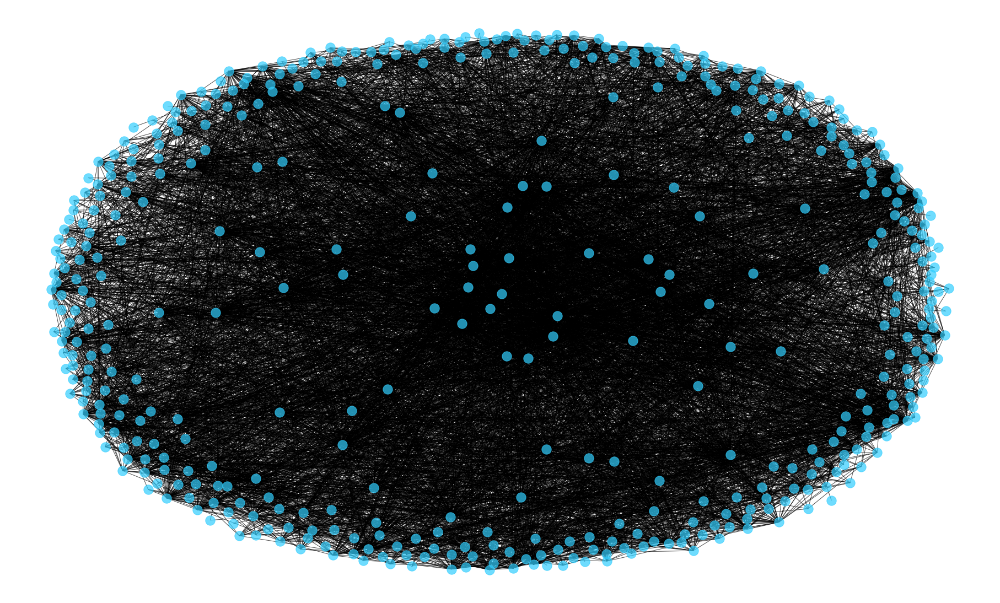

In [8]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(25,15))
nx.draw(G, pos=nx.spring_layout(G, k=3, seed=5), alpha=.7, node_color = '#32cefe')

## Refine the Visual

As you should see, the initial visualization is a globular mess! Refine the visualization to better picture the center core of the  network.

In [9]:
groups.describe()

,Unnamed: 0,group1,group2,weight
count,6692.000000,6.692000e+03,6.692000e+03,6692.000000
mean,3345.500000,1.253506e+07,1.296296e+07,2.301853
std,1931.958333,8.296540e+06,8.115721e+06,4.089973
min,0.000000,1.680140e+05,4.709400e+04,1.000000
25%,1672.750000,2.150491e+06,3.376042e+06,1.000000
50%,3345.500000,1.648781e+07,1.648781e+07,1.000000
75%,5018.250000,1.926639e+07,1.941635e+07,2.000000
max,6691.000000,2.609130e+07,2.609130e+07,91.000000


length of subset: 146


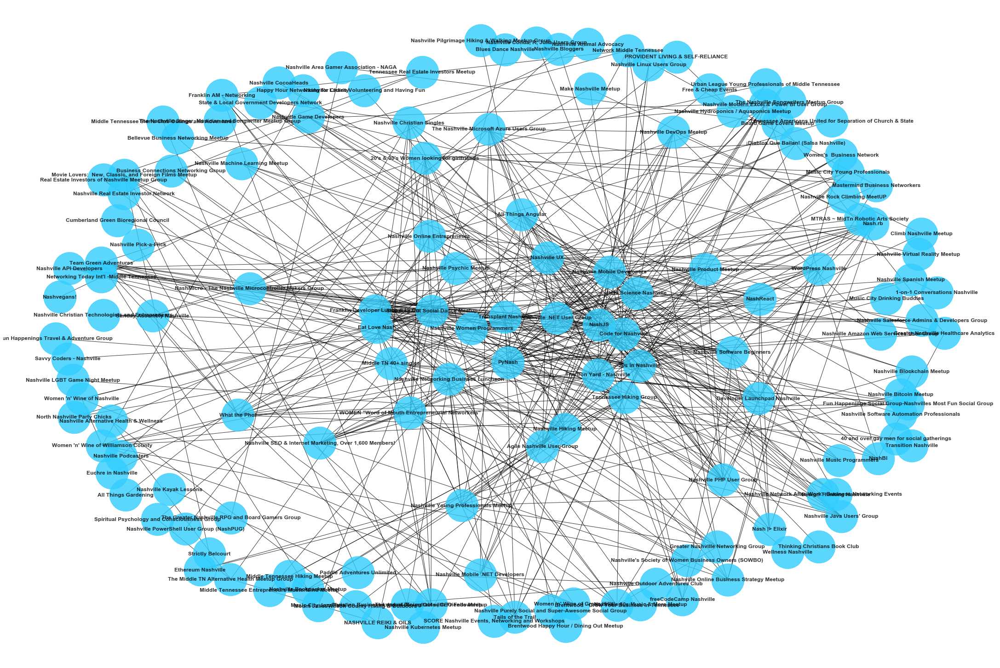

In [34]:
threshold = 5
G_subset = nx.Graph()

for row in groups.index:
    g1 = group_dict[groups.group1[row]]
    g2 = group_dict[groups.group2[row]]
    weight = groups.weight[row]
    if weight > threshold:
        G_subset.add_edge(g1, g2, weight=weight)

plt.figure(figsize=(30,20))
nx.draw(G_subset, pos=nx.spring_layout(G_subset, k=3, seed=5),
        alpha=.8, node_color="#32cefe", node_size=5000,
        with_labels=True, font_size=12, font_weight="bold")

print('length of subset: {}'.format(len(G_subset)))

## Try Clustering the Network

Now, that the dataset is a little more manageable, try clustering the remaining group nodes.

In [35]:
gn_clusters = list(nx.algorithms.community.centrality.girvan_newman(G_subset))
for n, clusters in enumerate(gn_clusters):
    print("After removing {} edges, there are {} clusters.".format(n, len(clusters)))

After removing 0 edges, there are 7 clusters.
After removing 1 edges, there are 8 clusters.
After removing 2 edges, there are 9 clusters.
After removing 3 edges, there are 10 clusters.
After removing 4 edges, there are 11 clusters.
After removing 5 edges, there are 12 clusters.
After removing 6 edges, there are 13 clusters.
After removing 7 edges, there are 14 clusters.
After removing 8 edges, there are 15 clusters.
After removing 9 edges, there are 16 clusters.
After removing 10 edges, there are 17 clusters.
After removing 11 edges, there are 18 clusters.
After removing 12 edges, there are 19 clusters.
After removing 13 edges, there are 20 clusters.
After removing 14 edges, there are 21 clusters.
After removing 15 edges, there are 22 clusters.
After removing 16 edges, there are 23 clusters.
After removing 17 edges, there are 24 clusters.
After removing 18 edges, there are 25 clusters.
After removing 19 edges, there are 26 clusters.
After removing 20 edges, there are 27 clusters.
After

## Determine An Optimal Clustering Schema

Finally, determine a final clustering organization.

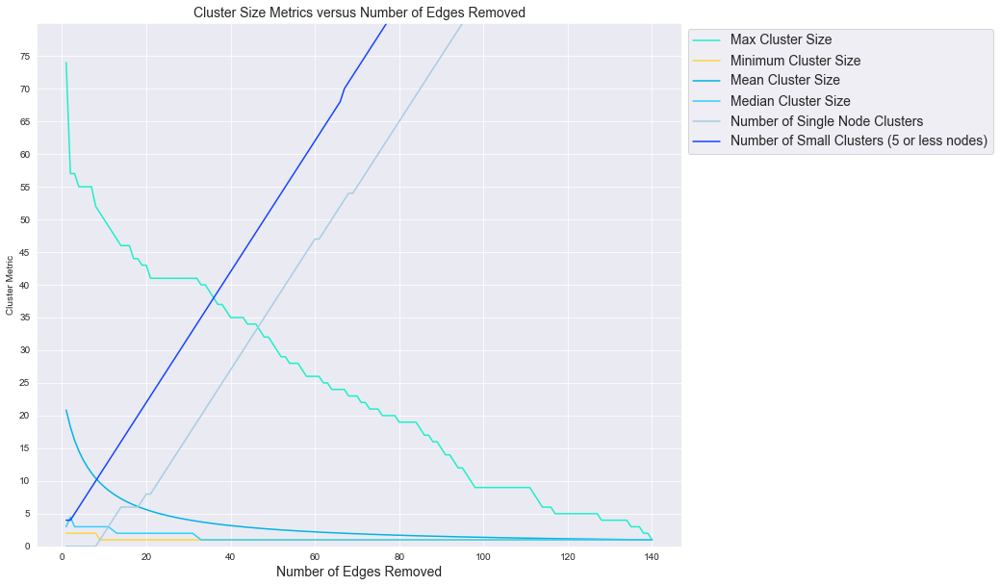

In [36]:
import numpy as np
import seaborn as sns
sns.set_style('darkgrid')
colors = ["#1cf0c7","#ffd43d","#00b3e6","#32cefe","#efefef",
          "#1443ff","#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99",
          "#e31a1c","#fdbf6f","#ff7f00","#cab2d6","#6a3d9a","#ffff99",
          "#b15928","#8dd3c7","#ffffb3","#bebada","#fb8072","#80b1d3",
          "#fdb462","#b3de69","#fccde5","#d9d9d9","#bc80bd","#ccebc5",
          "#ffed6f","#bf812d","#dfc27d","#f6e8c3","#f5f5f5","#c7eae5",
          "#80cdc1", "#35978f", "#01665e", "#003c30"]

fig = plt.figure(figsize=(12,10))

x = [n+1 for n in range(len(gn_clusters))]

max_cluster_size = [max([len(c) for c in cluster]) for cluster in gn_clusters]
plt.plot(x,max_cluster_size, color=colors[0], label='Max Cluster Size')

min_cluster_size = [min([len(c) for c in cluster]) for cluster in gn_clusters]
plt.plot(x,min_cluster_size, color=colors[1], label='Minimum Cluster Size')

mean_cluster_size = [np.mean([len(c) for c in cluster]) for cluster in gn_clusters]
plt.plot(x,mean_cluster_size, color=colors[2], label='Mean Cluster Size')

median_cluster_size = [np.median([len(c) for c in cluster]) for cluster in gn_clusters]
plt.plot(x,median_cluster_size, color=colors[3], label='Median Cluster Size')

single_node_clusters = [sum([1 if len(c)==1 else 0 for c in cluster]) for cluster in gn_clusters]
plt.plot(x,single_node_clusters, color=colors[6], label='Number of Single Node Clusters')

small_clusters = [sum([1 if len(c)<=5 else 0 for c in cluster ]) for cluster in gn_clusters]
plt.plot(x,small_clusters, color=colors[5], label='Number of Small Clusters (5 or less nodes)')

plt.legend(loc=(1.01,.75), fontsize=14)
plt.title('Cluster Size Metrics versus Number of Edges Removed', fontsize=14)
plt.xlabel('Number of Edges Removed', fontsize=14)
plt.ylabel('Cluster Metric')
plt.ylim(0,80)
plt.yticks(ticks=list(range(0,80,5)));


## Visualize the Clusters

Analyze the output of your clustering schema. Do any clusters of groups stand out to you?

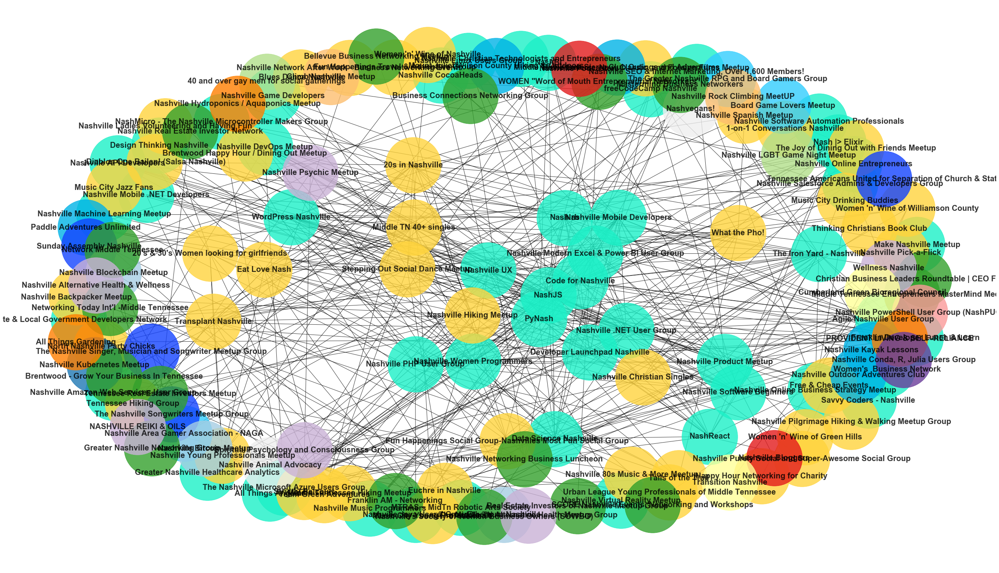

In [37]:
def plot_girvan_newman(G, clusters):
    #Your code here
    fig = plt.figure(figsize=(35,20))
    colors = ["#1cf0c7","#ffd43d","#00b3e6","#32cefe","#efefef",
          "#1443ff","#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99",
          "#e31a1c","#fdbf6f","#ff7f00","#cab2d6","#6a3d9a","#ffff99",
          "#b15928","#8dd3c7","#ffffb3","#bebada","#fb8072","#80b1d3",
          "#fdb462","#b3de69","#fccde5","#d9d9d9","#bc80bd","#ccebc5",
          "#ffed6f","#bf812d","#dfc27d","#f6e8c3","#f5f5f5","#c7eae5",
          "#80cdc1", "#35978f", "#01665e", "#003c30"]
    for n , c in enumerate(clusters):
        ci = G.subgraph(c)
        nx.draw(ci, pos=nx.spring_layout(G_subset, k=3.6, seed=3), with_labels=True, node_color=colors[n],
                alpha=.8, node_size=20000, font_weight="bold", font_size=20)
    plt.show()
sns.set_style('white')
plot_girvan_newman(G_subset, gn_clusters[10])

Even with removing the edges from the most frequent xx, the graph is still very crowded.

In [44]:
#try transpose in to a dataframe, where each column is a cluster, and each row is a group in that cluster
clusters = pd.DataFrame(gn_clusters[20]).transpose()


ValueError: DataFrame constructor not properly called!

In [43]:
gn_clusters[20]

({'Agile Nashville User Group',
  'All Things Angular',
  'Code for Nashville',
  'Data Science Nashville',
  'Design Thinking Nashville',
  'Developer Launchpad Nashville',
  'Franklin Developer Lunch & Learn',
  'Greater Nashville Healthcare Analytics',
  'Nash |> Elixir',
  'Nash.rb',
  'NashBI',
  'NashJS',
  'NashMicro - The Nashville Microcontroller Makers Group',
  'NashReact',
  'Nashville .NET User Group',
  'Nashville API Developers',
  'Nashville Amazon Web Services User Group',
  'Nashville CocoaHeads',
  'Nashville DevOps Meetup',
  'Nashville Game Developers',
  "Nashville Java Users' Group",
  'Nashville Linux Users Group',
  'Nashville Machine Learning Meetup',
  'Nashville Mobile .NET Developers',
  'Nashville Mobile Developers',
  'Nashville Modern Excel & Power BI User Group',
  'Nashville Music Programmers',
  'Nashville Online Entrepreneurs',
  'Nashville PHP User Group',
  'Nashville Product Meetup',
  'Nashville SEO & Internet Marketing, Over 1,600 Members!',
  '

In [40]:
clusters_20 = list(gn_clusters[20])
clusters = pd.DataFrame(clusters_20)
clusters = clusters.transpose()
clusters.columns = ["Cluster{}".format(i) for i in range(1,len(clusters.columns)+1)]
clusters

,Cluster1,Cluster2,Cluster3,Cluster4,Cluster5,Cluster6,Cluster7,Cluster8,Cluster9,Cluster10,...,Cluster18,Cluster19,Cluster20,Cluster21,Cluster22,Cluster23,Cluster24,Cluster25,Cluster26,Cluster27
0,Data Science Nashville,North Nashville Party Chicks,Nashville Outdoor Adventures Club,The Greater Nashville RPG and Board Gamers Group,Nashvegans!,Tennessee Americans United for Separation of C...,Nashville Blockchain Meetup,Nashville Kubernetes Meetup,Nashville LGBT Game Night Meetup,Nashville Networking Business Luncheon,...,Make Nashville Meetup,Nashville Alternative Health & Wellness,Nashville Virtual Reality Meetup,Real Estate Investors of Nashville Meetup Group,"Nashville Conda, R, Julia Users Group",Transition Nashville,Nashville Christian Technologists and Entrepre...,Nashville Pilgrimage Hiking & Walking Meetup G...,Savvy Coders - Nashville,Nashville Software Automation Professionals
1,Nashville CocoaHeads,Thinking Christians Book Club,Paddle Adventures Unlimited,Nashville Area Gamer Association - NAGA,Nashville Animal Advocacy,The Nashville Songwriters Meetup Group,Nashville Bitcoin Meetup,None,40 and over gay men for social gatherings,Nashville's Society of Women Business Owners (...,...,MTRAS ~ MidTn Robotic Arts Society,The Middle TN Alternative Health Meetup Group,None,Nashville Real Estate Investor Network,None,Cumberland Green Bioregional Council,None,None,None,None
2,Nashville Product Meetup,Stepping Out Social Dance Meetup,Middle Tennessee Sierra Club Outings and Adven...,Board Game Lovers Meetup,None,Sunday Assembly Nashville,Ethereum Nashville,None,None,"WOMEN ""Word of Mouth Entrepreneurial Networkers""",...,None,Nashville Psychic Meetup,None,Tennessee Real Estate Investors Meetup,None,None,None,None,None,None
3,NashBI,Fun Happenings Social Group-Nashvilles Most Fu...,Nashville Kayak Lessons,None,None,"The Nashville Singer, Musician and Songwriter ...",None,None,None,Christian Business Leaders Roundtable | CEO Fe...,...,None,Wellness Nashville,None,None,None,None,None,None,None,None
4,Nashville Amazon Web Services User Group,"Movie Lovers: New, Classic, and Foreign Films...",Mount Juliet/Wilson County Hiking & Outdoors,None,None,None,None,None,None,Mastermind Business Networkers,...,None,NASHVILLE REIKI & OILS,None,None,None,None,None,None,None,None
5,State & Local Government Developers Network,Nashville Spanish Meetup,None,None,None,None,None,None,None,Greater Nashville Networking Group,...,None,Spiritual Psychology and Consciousness Group,None,None,None,None,None,None,None,None
6,"Nashville SEO & Internet Marketing, Over 1,600...",What the Pho!,None,None,None,None,None,None,None,Network Middle Tennessee,...,None,None,None,None,None,None,None,None,None,None
7,Nashville Mobile .NET Developers,Music City Young Professionals,None,None,None,None,None,None,None,Bellevue Business Networking Meetup,...,None,None,None,None,None,None,None,None,None,None
8,The Nashville Microsoft Azure Users Group,Fun Happenings Travel & Adventure Group,None,None,None,None,None,None,None,Middle Tennessee Entrepreneurs MasterMind Meetup,...,None,None,None,None,None,None,None,None,None,None
9,All Things Angular,20s in Nashville,None,None,None,None,None,None,None,"SCORE Nashville Events, Networking and Workshops",...,None,None,None,None,None,None,None,None,None,None


## Summary

In this lab, you got another chance to practice your network clustering skills, investigating a meetup dataset of events and groups surrounding the Nashville area. If you're up for the challenge, feel free to continue investigating the dataset and trying to cluster users or events!                                                                                                                                                               